<center><h1>Dataset Analysis Notebook</h1></center>
<center><h2>Matthias Bartolo</h2></center>

**<h3>Packages</h3>**

In [1]:
# !pip install roboflow

In [2]:
import os
import json
import cv2
from matplotlib import pyplot as plt
import matplotlib.patches as patches
from PIL import Image, ImageDraw, ImageFont
import numpy as np
from roboflow import Roboflow

**<h3>Downloading the dataset from Roboflow</h3>**

In [ ]:
download_datasets = False # True
if download_datasets:
    import os
    import json
    from roboflow import Roboflow

    HOME = os.getcwd()
    # Go back one directory to the root of the project
    HOME = os.path.dirname(HOME)
    print("Downloading datasets to: ", os.path.join(HOME, 'datasets'))

    if not os.path.isdir(os.path.join(HOME, 'datasets')):
        os.mkdir(os.path.join(HOME, 'datasets'))
    os.chdir(os.path.join(HOME, 'datasets'))

    ########################################################## ROBOFLOW ##########################################################
    # SODA Dataset
    rf = Roboflow(api_key="nyynHs3oneLLx01D04rC")
    # project = rf.workspace("soda-dataset").project("01m-all")
    # version = project.version(1)
    # dataset = version.download("coco")

    project = rf.workspace("soda-dataset").project("soda-litter-dataset-all")
    version = project.version(1)
    dataset = version.download("coco")

    ########################################################## ROBOFLOW ##########################################################

    # Ensure correct folder structure
    directories = ['train', 'valid', 'test']
    # Change the directories to get the full path
    directories = [os.path.join(dataset.location, directory) for directory in directories]

    for directory in directories:
        os.makedirs(f'{directory}/images', exist_ok=True)  # Create 'images' subfolder

    # Move images to corresponding 'images' subfolders while keeping annotations in the main split folder
    for directory in directories:
        image_dir = os.path.join(dataset.location, directory)  # Original dataset directory
        dest_image_dir = f'{directory}/images'  # Destination images folder

        annotation_file = os.path.join(image_dir, "_annotations.coco.json")
        new_annotation_path = os.path.join(directory, "_annotations.coco.json")

        for file_name in os.listdir(image_dir):  # Iterate over files in the dataset split
            src_path = os.path.join(image_dir, file_name)

            if file_name.endswith('.jpg') or file_name.endswith('.png'):  # Move images
                dest_path = os.path.join(dest_image_dir, file_name)
            elif file_name == "_annotations.coco.json":  # Keep annotations in the main split folder
                dest_path = new_annotation_path
            else:
                continue  # Ignore other file types

            if os.path.isfile(src_path):  # Ensure it's a file before moving
                os.rename(src_path, dest_path)

        # Update _annotations.coco.json to reflect the new image paths
        if os.path.isfile(new_annotation_path):
            with open(new_annotation_path, 'r') as f:
                data = json.load(f)

            for image in data["images"]:
                image["file_name"] = f"{image['file_name']}"  # Update path in annotation

            with open(new_annotation_path, 'w') as f:
                json.dump(data, f, indent=4)  # Save the updated JSON

**<h3>Defining Paths and Constants</h3>**

In [4]:
# Defining paths
image_path = '../datasets/SODA-Litter-Dataset-All-1/test/images'
annotation_path = '../datasets/SODA-Litter-Dataset-All-1/test'
dataset_path = '../datasets/SODA-Litter-Dataset-All-1'

In [5]:
# Defining Labels
LABELS = {
    0: "Background",
    1: "Clear Plastic Bottle",
    2: "Drink Can",
    3: "Drink Carton",
    4: "Glass Bottle",
    5: "Glass Jar",
    6: "Other Plastic Bottle",
}

# Improved label colors for better representation
LABEL_COLORS = {
    "Background": (0, 0, 0),  # Black for background
    "Clear Plastic Bottle": (180, 240, 240),  # Light cyan (clear plastic reflection)
    "Drink Can": (60, 60, 220),  # Metallic blue (often used in soda cans)
    "Drink Carton": (60, 180, 255),  # Bright orange (carton packaging colors)
    "Glass Bottle": (0, 130, 0),  # Dark green (green glass bottles)
    "Glass Jar": (100, 70, 50),  # Brownish (amber glass jars)
    "Other Plastic Bottle": (200, 200, 100),  # Yellowish plastic (common for detergent bottles)
}

**<h3>Loading Images</h3>**

**<h4>Function which loads images from the given path</h4>**

In [6]:
def load_imgs(path, no_of_images, img_size=(224,224), do_display=False):
    """Function which loads images from the given path

    Args:
        path (str): path to the folder with images.
        no_of_images (int): number of images to load.
        img_size (tuple, optional): size of the image. Defaults to (224,224).
        do_display (bool): flag to display images. Defaults to False.

    Returns:
        images (dict): dictionary with images
        image_paths (list): list of image paths
    """
    # Declaring necessary variables
    images = {}
    image_paths = []

    # Iterating through all images in the given path
    for img_no, img_name in enumerate(os.listdir(path)):
        # Breaking from loop if no_of_images is reached
        if img_no == no_of_images:
            break

        # Loading, resizing and storing images in a dictionary
        image_paths.append(os.path.join(path, img_name))
        img = Image.open(os.path.join(path, img_name))
        img = img.resize(img_size)
        images[img_no] = img

        # Displaying images if do_display is True
        if do_display:
            print('\033[1m' + 'Image {}  Image name: {}'.format(img_no+1, img_name) + '\033[0m')
            display(img)
    
    # Returning images and image paths
    return images, image_paths

In [7]:
# Specifying path to the images
no_of_images = 15 #None
do_display = False

# Loading images
images, image_paths = load_imgs(path=image_path, no_of_images=no_of_images, do_display=do_display)

**<h3>Loading Annotations</h3>**

**<h4>Function to convert bounding box coordinates from YOLOv8 format to PIL format</h4>**

In [8]:
def convert_bbox(coordinates, target_size, original_size, padding=None):
    """Convert COCO bounding box or polygon coordinates while accounting for letterboxing.

    Args:
        coordinates (list): Bounding box [x_min, y_min, width, height] or polygon [x1, y1, x2, y2, ...].
        target_size (tuple): Target (width, height) after resizing.
        original_size (tuple): Original (width, height) before resizing.
        padding (tuple, optional): Padding applied to (left, top, right, bottom). Defaults to None.

    Returns:
        list: Resized bounding box coordinates in PIL format [x1, y1, x2, y2].
    """
    orig_w, orig_h = original_size
    target_w, target_h = target_size

    # Compute scaling factors
    scale_x = target_w / orig_w
    scale_y = target_h / orig_h

    if padding:
        pad_left, pad_top, pad_right, pad_bottom = padding
        scale_x = (target_w - pad_left - pad_right) / orig_w
        scale_y = (target_h - pad_top - pad_bottom) / orig_h

    if len(coordinates) == 4:
        # COCO format bounding box: [x_min, y_min, width, height]
        x_min, y_min, width, height = coordinates

        # Adjust for padding first, then scale
        x_min = (x_min - (padding[0] if padding else 0))
        y_min = (y_min - (padding[1] if padding else 0))

        # Convert to [x1, y1, x2, y2] with precise scaling
        new_x1 = int(x_min * scale_x)
        new_y1 = int(y_min * scale_y)
        new_x2 = int((x_min + width) * scale_x)
        new_y2 = int((y_min + height) * scale_y)

    elif len(coordinates) > 4 and len(coordinates) % 2 == 0:
        # Handling polygon format
        x_coords = coordinates[0::2]  # Even indices → x coordinates
        y_coords = coordinates[1::2]  # Odd indices → y coordinates

        new_x1 = int((min(x_coords) - (padding[0] if padding else 0)) * scale_x)
        new_y1 = int((min(y_coords) - (padding[1] if padding else 0)) * scale_y)
        new_x2 = int((max(x_coords) - (padding[0] if padding else 0)) * scale_x)
        new_y2 = int((max(y_coords) - (padding[1] if padding else 0)) * scale_y)

    else:
        raise ValueError("Invalid format. Must be [x_min, y_min, width, height] or polygon [x1, y1, x2, y2, ...]")

    return [new_x1, new_y1, new_x2, new_y2]


**<h4>Function which loads annotations from the given path</h4>**

In [9]:
def load_annotations(path, labels, no_of_annotations, do_display=False):
    """Function which loads annotations from a COCO JSON file.

    Args:
        path (str): Path to the folder containing `_annotations.coco.json`.
        labels (dict): Dictionary mapping label IDs to their string names.
        no_of_annotations (int): Number of annotations to load.
        do_display (bool): Flag to display annotations. Defaults to False.

    Returns:
        annotations (dict): Dictionary with annotations.
    """
    # Path to COCO annotation file
    annotation_file = os.path.join(path, "_annotations.coco.json")

    # Load JSON file
    with open(annotation_file, 'r') as f:
        data = json.load(f)

    # Prepare a dictionary to store annotations
    annotations = {}

    # Extract image information
    image_id_to_filename = {img["id"]: img["file_name"] for img in data["images"]}

    # Iterate through annotations
    count = 0
    for ann in data["annotations"]:
        if count == no_of_annotations:  # Stop if limit is reached
            break

        image_id = ann["image_id"]
        filename = image_id_to_filename[image_id]
        label = labels[ann["category_id"]]
        bbox = ann["bbox"]  # COCO format: [x, y, width, height]

        # Store annotation
        if filename not in annotations:
            annotations[filename] = []

        annotations[filename].append({label: bbox})
        count += 1  # Increment count

        # Display if needed
        if do_display:
            print('\033[35m' + f'Filename: {filename}' + '\033[0m')
            print('\033[33m' + 'Label:' + '\033[0m' + f' {label}', 
                  '\033[32m' + 'Coordinates:' + '\033[0m' + f' {bbox}')
            print()

    return annotations

In [10]:
# Specifying path to the images
no_of_annotations = None
do_display = False

# Loading annotations
annotations = load_annotations(path=annotation_path, labels=LABELS, no_of_annotations=no_of_annotations, do_display=do_display)

**<h3>Plotting Annotations on Images</h3>**

**<h4>Function which plots annotations on images</h4>**

In [11]:
def plot_image_annotations(image_paths, annotations, label_colors, target_size, do_display=False, text_display=True, font_scale=1, alpha=0.4, save_path=None):
    """Function which plots images with annotations.

    Args:
        image_paths (list): List of image paths.
        annotations (dict): Dictionary with annotations.
        label_colors (dict): Dictionary with annotation label colors.
        target_size (tuple): Target size of the image.
        do_display (bool): Flag to display images with annotations. Defaults to False.
        text_display (bool): Flag to display annotation labels. Defaults to True.
        font_scale (float): Font scale for the annotation labels. Defaults to 1.
        alpha (float): Alpha value for the bounding boxes. Defaults to 0.4.
        save_path (str): Path to save the images with annotations. Defaults to None.
    """

    # Iterating through all the images
    for image_path in image_paths:
        # Read the image
        image = cv2.imread(image_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        
        # Get original image size
        original_size = (image.shape[1], image.shape[0])  # (width, height)

        # Resize image for annotation display
        resized_image = cv2.resize(image, target_size)

        # Retrieve image name
        image_name = os.path.basename(image_path)

        # Retrieve annotations for the current image
        image_annotations = annotations.get(image_name, [])

        # Overlay bounding boxes
        for annotation in image_annotations:
            label = list(annotation.keys())[0]
            bbox = annotation[label]

            # Convert bounding box coordinates
            bbox = convert_bbox(bbox, target_size, original_size)  
            x1, y1, x2, y2 = bbox

            # Ensure bounding box coordinates stay within image bounds
            x1, y1, x2, y2 = max(0, x1), max(0, y1), min(target_size[0], x2), min(target_size[1], y2)

            # Create overlay for transparency effect
            overlay = resized_image.copy()
            cv2.rectangle(overlay, (x1, y1), (x2, y2), label_colors[label], cv2.FILLED)
            resized_image = cv2.addWeighted(resized_image, 1 - alpha, overlay, alpha, 0)

            # Draw bounding box outline
            cv2.rectangle(resized_image, (x1, y1), (x2, y2), label_colors[label], 2)

            # Add label text
            if text_display:
                font = cv2.FONT_HERSHEY_SIMPLEX
                (text_w, text_h), baseline = cv2.getTextSize(label, font, font_scale, 2)

                # Adjust text position to stay just above the bounding box
                text_x = min(x1, target_size[0] - text_w)
                text_y = max(y1, text_h + 5)  # Position label directly above the bounding box

                # Draw label background just above the box
                cv2.rectangle(resized_image, (text_x, text_y - text_h - baseline), (text_x + text_w, text_y), label_colors[label], -1)
                cv2.putText(resized_image, label, (text_x, text_y - 5), font, font_scale, (255, 255, 255), 2, cv2.LINE_AA)

        # Resize the final image back to original size
        final_image = cv2.resize(resized_image, (original_size[0], original_size[1]))

        # Save the annotated image
        if save_path:
            os.makedirs(save_path, exist_ok=True)
            save_filename = os.path.join(save_path, f"{image_name}_annotated.jpg")
            cv2.imwrite(save_filename, cv2.cvtColor(final_image, cv2.COLOR_RGB2BGR))

        # Display the image
        if do_display:
            plt.figure(figsize=(10, 10))
            plt.imshow(final_image)
            plt.axis('off')
            plt.show()

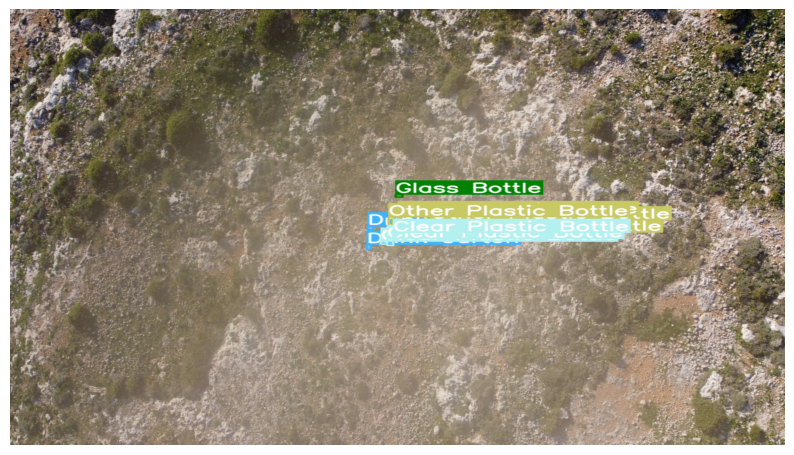

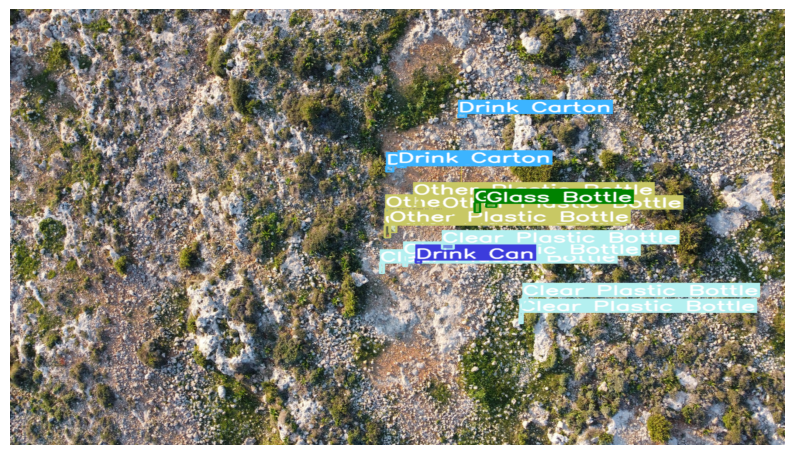

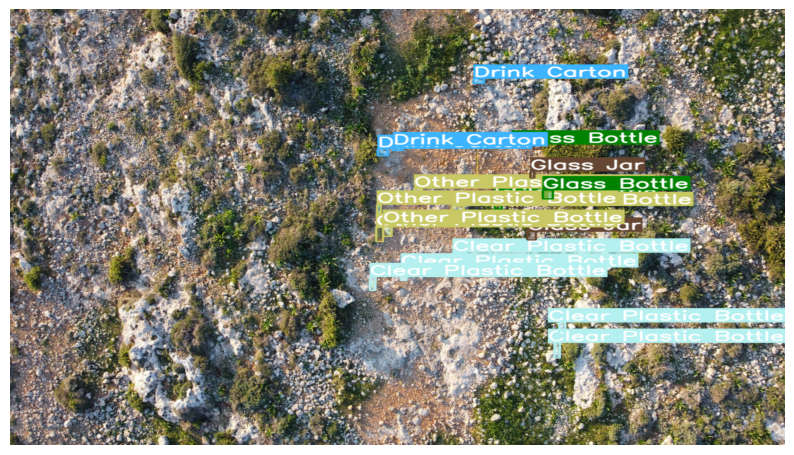

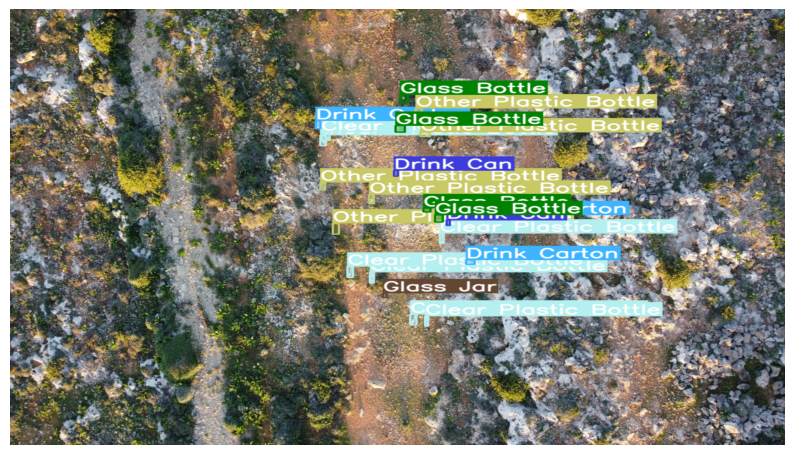

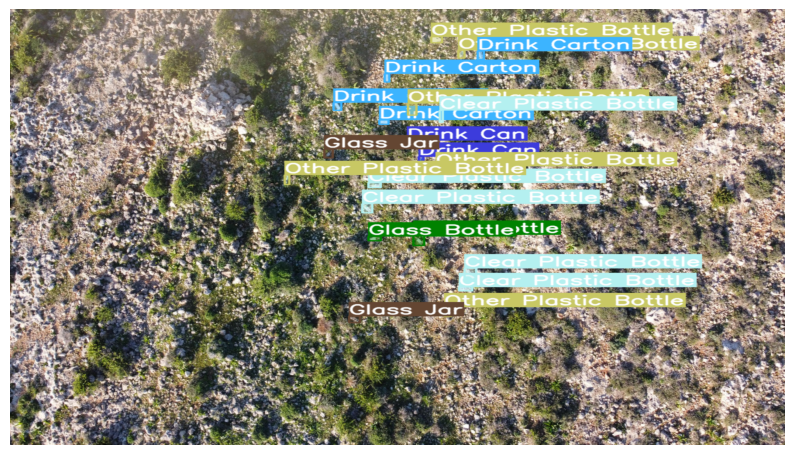

...

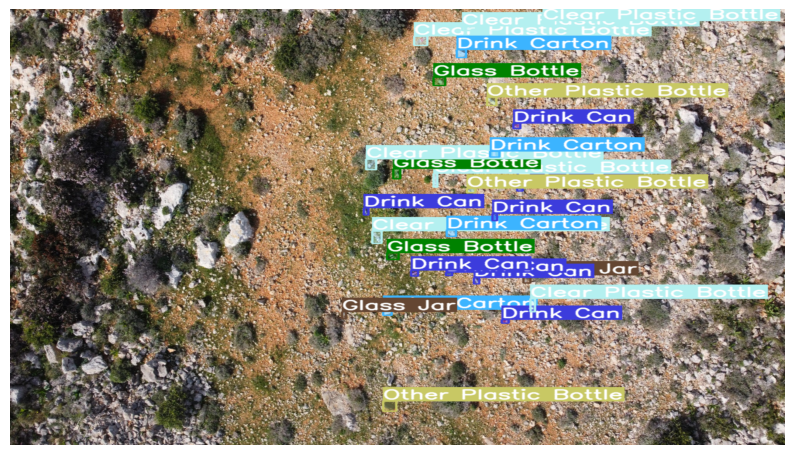

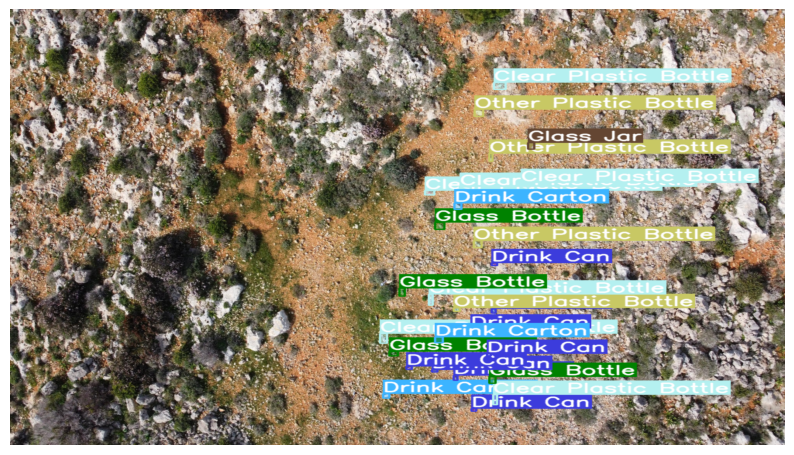

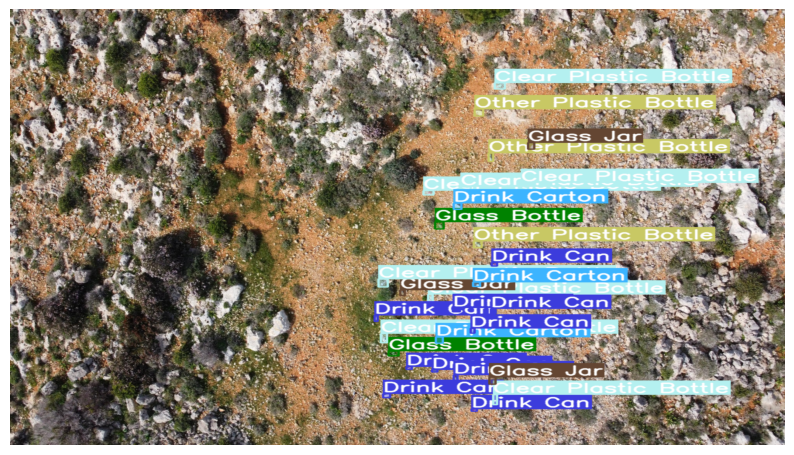

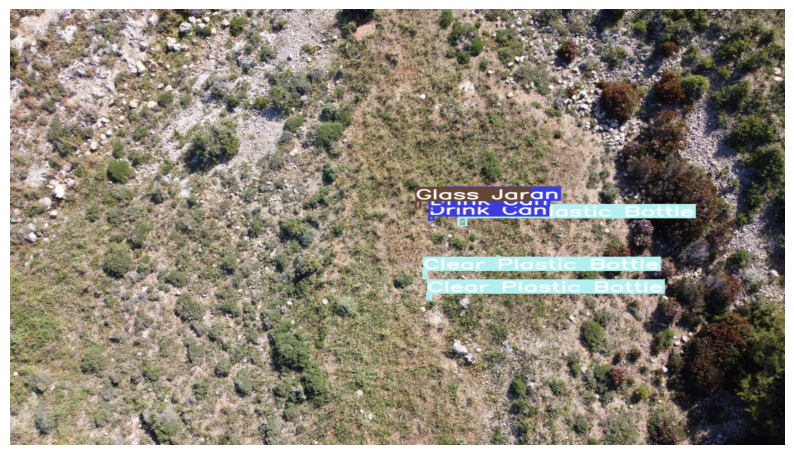

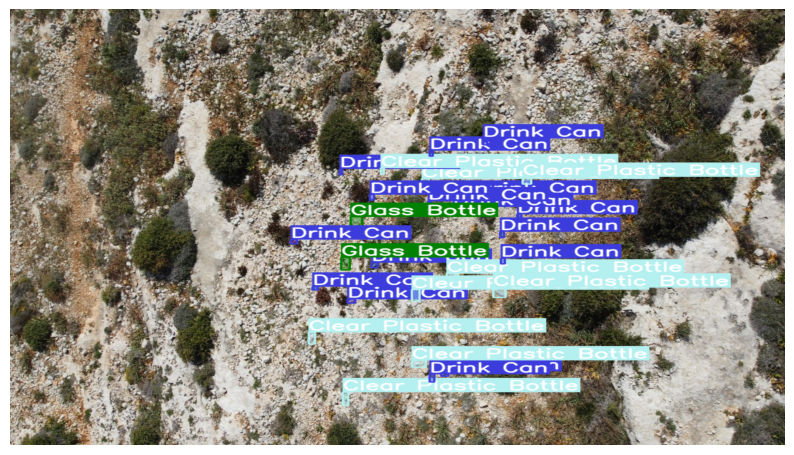

In [12]:
# Specifying options
do_display = True

# Plotting images with annotations
plot_image_annotations(image_paths=image_paths, annotations=annotations, label_colors=LABEL_COLORS, target_size=(1000, 1000) , do_display=do_display, save_path=os.path.join(dataset_path, 'dataset_statistics','annotated_images'))

**<h3>Dataset Statistical Analysis</h3>**

In [13]:
import os
import glob
import json
import cv2
import numpy as np
from tqdm import tqdm
from collections import defaultdict

# COCO image size categories
def categorize_object_size(width, height):
    """
    Categorize object size based on its area (following COCO size standards).
    Small: area < 32x32
    Medium: 32x32 <= area < 96x96
    Large: area >= 96x96

    Args:
        width (int): Object width
        height (int): Object height

    Returns:
        str: Object size category    
    """
    area = width * height
    if area < 32**2:
        return "Small"
    elif area < 96**2:
        return "Medium"
    else:
        return "Large"

def load_dataset_statistics(dataset_path):
    """
    Load dataset statistics from COCO annotations.

    Args:
        dataset_path (str): Path to the dataset directory

    Returns:
        dict: Image counts for each subset
        dict: Annotation counts for each label and subset
        list: Number of objects per image
        np.ndarray: Object heatmap
        dict: Object sizes
    """
    subsets = ['train', 'valid', 'test']  # Adjust based on your dataset structure
    
    image_counts = {}
    annotation_counts = defaultdict(lambda: {'train': 0, 'valid': 0, 'test': 0, 'total': 0})
    objects_per_image = []
    heatmap_size = (1000, 1000)
    heatmap = np.zeros(heatmap_size, dtype=np.int32)
    object_sizes = {'Small': 0, 'Medium': 0, 'Large': 0}
    relative_object_sizes = {}

    for subset in subsets:
        # Path to the annotation file for the subset
        coco_annotation_file = os.path.join(dataset_path, subset, '_annotations.coco.json')
        
        # Load the COCO annotations for this subset
        with open(coco_annotation_file, 'r') as f:
            coco_data = json.load(f)

        # Map category_id to category name for easy lookup
        category_id_to_name = {category['id']: category['name'] for category in coco_data['categories']}
        
        img_dir = os.path.join(dataset_path, subset, 'images')
        
        if not os.path.exists(img_dir):
            continue
        
        image_files = glob.glob(os.path.join(img_dir, '*.jpg')) + glob.glob(os.path.join(img_dir, '*.png'))
        image_counts[subset] = len(image_files)

        # Build image_id to filename mapping
        image_name_to_id = {img['file_name']: img['id'] for img in coco_data['images']}

        # Process images and annotations
        for img_file in tqdm(image_files, desc=f"Processing {subset} images", unit="image"):
            img_name = os.path.basename(img_file)
            
            # Check if img_name exists in image_name_to_id mapping
            if img_name not in image_name_to_id:
                print(f"Warning: {img_name} not found in COCO annotations.")
                continue

            image_id = image_name_to_id[img_name]
            
            # Retrieve the image size
            img = cv2.imread(img_file)
            img_height, img_width = img.shape[:2]

            # Find corresponding annotations for this image
            img_annotations = [anno for anno in coco_data['annotations'] if anno['image_id'] == image_id]

            objects_per_image.append(len(img_annotations))

            for annotation in img_annotations:
                # Get category and bounding box from annotation
                category_id = annotation['category_id']
                bbox = annotation['bbox']  # COCO format: [x, y, width, height]
                x, y, width, height = bbox

                # Categorize the object by size
                object_category = categorize_object_size(width, height)
                object_sizes[object_category] += 1

                # Add relative object size to the dictionary (Average of width and height)
                relative_size = (width + height) / 2
                relative_object_sizes[relative_size] = relative_object_sizes.get(relative_size, 0) + 1
                
                # Update annotation counts for each label
                category_name = category_id_to_name[category_id]
                annotation_counts[category_name][subset] += 1
                annotation_counts[category_name]['total'] += 1

                # Convert bounding box coordinates to heatmap indices (scaled to 1000x1000 grid)
                x_min = int(x * 1000 / img_width)
                x_max = int((x + width) * 1000 / img_width)
                y_min = int(y * 1000 / img_height)
                y_max = int((y + height) * 1000 / img_height)

                # Clamp indices to valid range [0, 1000)
                x_min = max(0, min(999, x_min))
                x_max = max(0, min(999, x_max))
                y_min = max(0, min(999, y_min))
                y_max = max(0, min(999, y_max))
                
                # Update heatmap within the bounding box region
                heatmap[y_min:y_max, x_min:x_max] += 1

    return image_counts, annotation_counts, objects_per_image, heatmap, object_sizes, relative_object_sizes

# Set dataset path
image_counts, annotation_counts, objects_per_image, heatmap, object_sizes, relative_object_sizes = load_dataset_statistics(dataset_path)


Processing test images: 100%|██████████| 162/162 [00:05<00:00, 28.78image/s]


**<h3>Plotting Dataset Statistical Analysis</h3>**

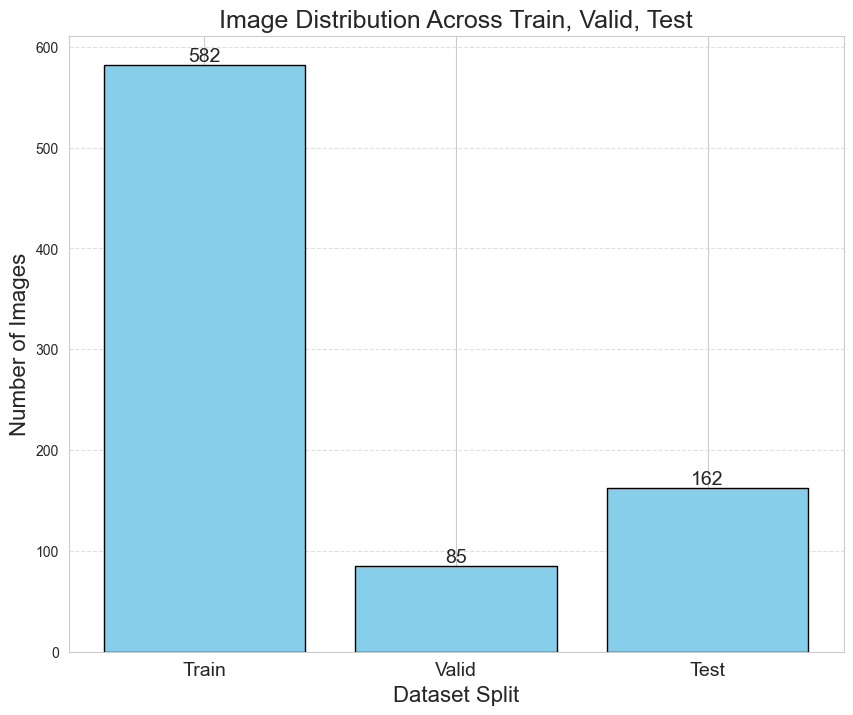

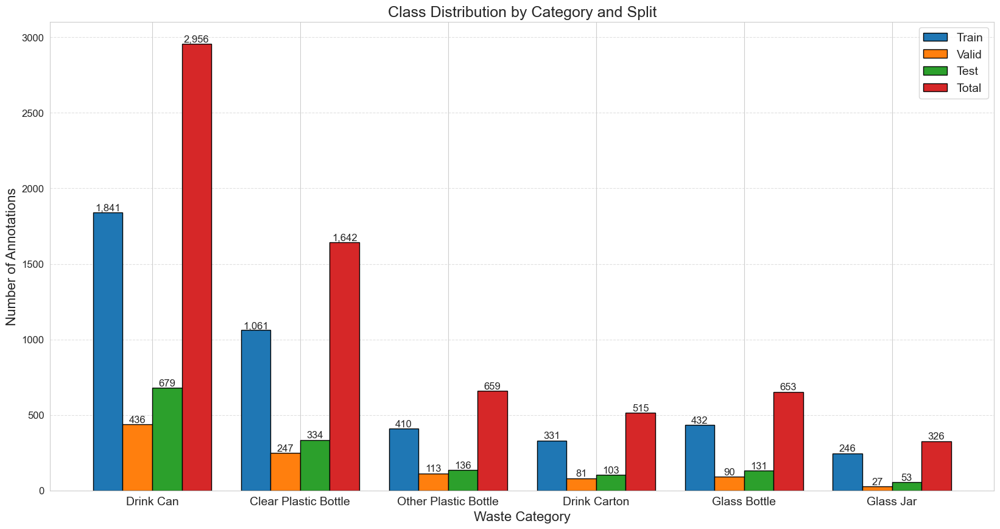

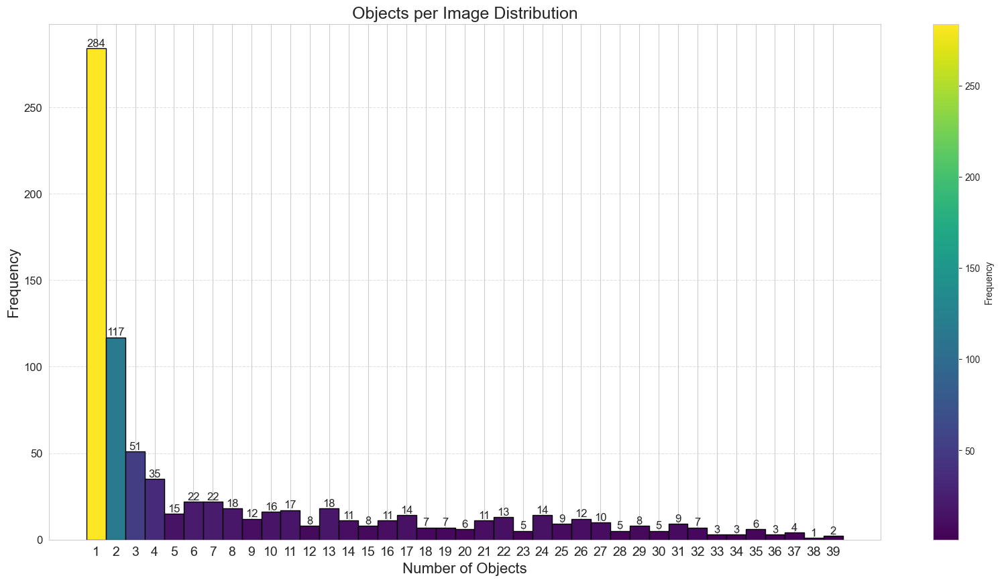

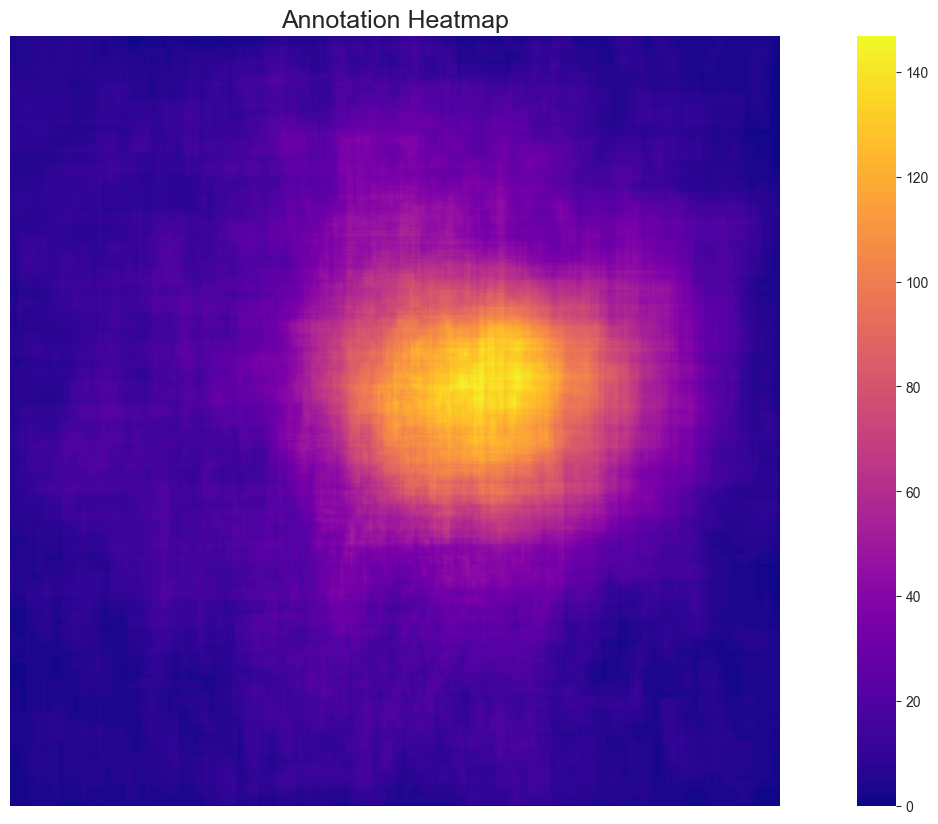

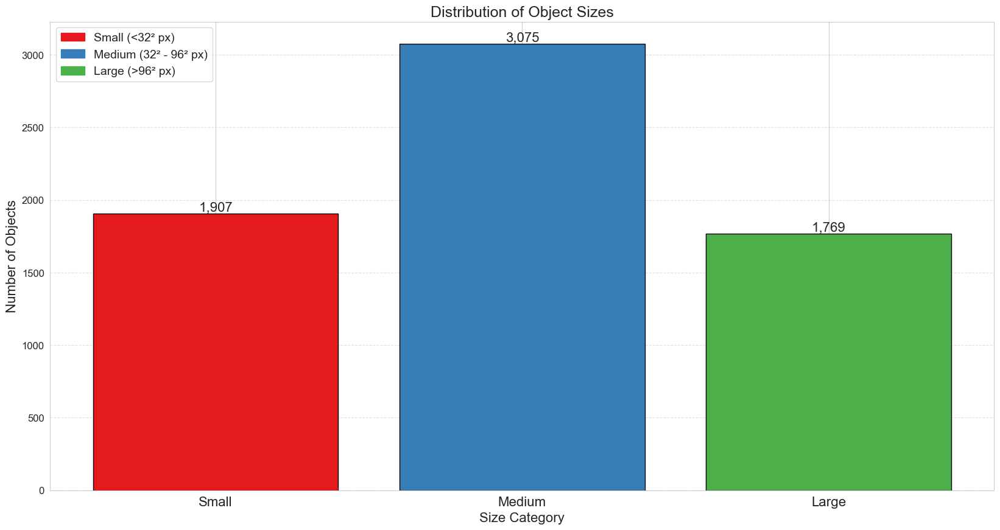

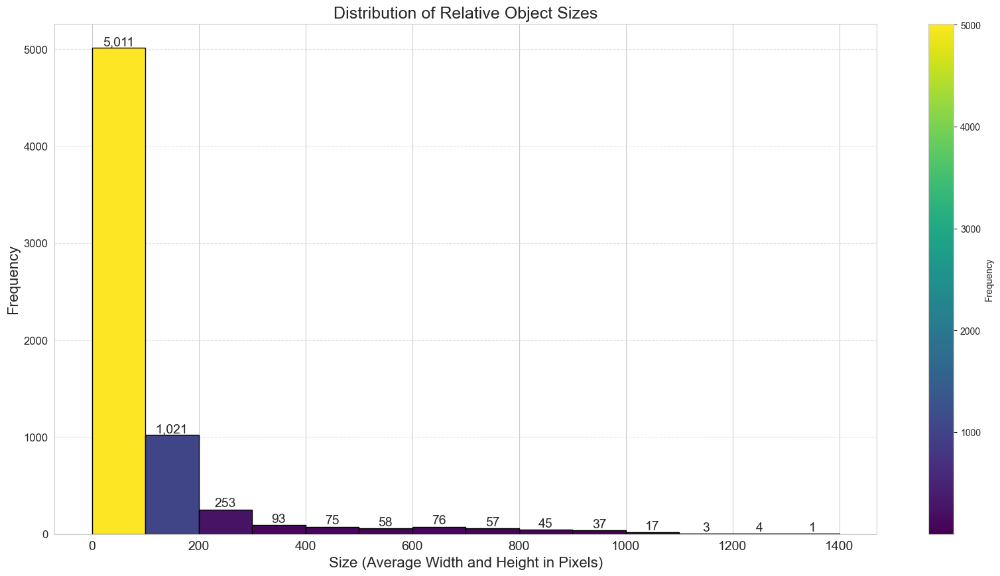

In [14]:
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.cm as cm
from matplotlib.patches import Patch

def plot_dataset_statistics(image_counts, annotation_counts, objects_per_image, heatmap, object_sizes, relative_object_sizes):
    """
    Plot dataset statistics including image distribution, annotation distribution, objects per image distribution,
    annotation heatmap, and object size distribution.

    Args:
        image_counts (dict): Image counts for each subset
        annotation_counts (dict): Annotation counts for each label and subset
        objects_per_image (list): Number of objects per image
        heatmap (np.ndarray): Object heatmap
        object_sizes (dict): Object sizes
        relative_object_sizes (dict): Relative object sizes

    """
    save_path = os.path.join(dataset_path, 'dataset_statistics')
    os.makedirs(save_path, exist_ok=True)
    sns.set_style("whitegrid")  # Use a clean, modern style

    # Capitalize the labels for better readability
    image_counts = {subset.capitalize(): count for subset, count in image_counts.items()}

    # 1. Image Distribution
    plt.figure(figsize=(10, 8))
    bars = plt.bar(image_counts.keys(), image_counts.values(), color='skyblue', edgecolor='black')

    for bar in bars:
        yval = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2, yval, f"{yval:,}", ha='center', va='bottom', fontsize=14)

    plt.title("Image Distribution Across Train, Valid, Test", fontsize=18)
    plt.xlabel("Dataset Split", fontsize=16)
    plt.ylabel("Number of Images", fontsize=16)
    plt.grid(axis='y', linestyle='--', alpha=0.6)
    # Set the x-axis size to match the number of bars
    plt.xticks(range(len(image_counts)), fontsize=14)
    plt.savefig(os.path.join(save_path, "image_distribution.png"))
    plt.show()

    # Categories based on the keys of annotation_counts
    categories = list(annotation_counts.keys())
    sub_categories = ['train', 'valid', 'test']

    # Width of bars
    width = 0.2

    # x positions for categories
    x = np.arange(len(categories))

    # Colors for train, valid, test, total
    colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728']

    # Calculate the total values for each category
    total_values = [sum([annotation_counts[label][subset] for subset in sub_categories]) for label in categories]

    # Compute the offsets for centering bars
    offsets = [-1.5 * width, -0.5 * width, 0.5 * width, 1.5 * width]  # Adjust offsets to center

    # Modify category labels to remove underscores and capitalize words
    formatted_categories = [category.replace('_', ' ').title() for category in categories]

    # Plotting
    fig, ax = plt.subplots(figsize=(20, 10))

    # Plot bars for train, valid, test
    for i, subset in enumerate(sub_categories):
        values = [annotation_counts[label][subset] for label in categories]
        bars = ax.bar(x + offsets[i], values, width, label=subset.capitalize(), color=colors[i], edgecolor='black')
        
        # Add annotations on top of each bar
        for bar in bars:
            yval = bar.get_height()
            ax.text(bar.get_x() + bar.get_width() / 2, yval, f"{yval:,}", ha='center', va='bottom', fontsize=12)

    # Plot the total bars
    bars = ax.bar(x + offsets[3], total_values, width, label="Total", color=colors[3], edgecolor='black')
    for bar in bars:
        yval = bar.get_height()
        ax.text(bar.get_x() + bar.get_width() / 2, yval, f"{yval:,}", ha='center', va='bottom', fontsize=12)

    # Adjust the x-tick positions
    ax.set_xticks(x)
    ax.set_xticklabels(formatted_categories, fontsize=14)  # Use the formatted categories

    # Add title and labels
    ax.set_title("Class Distribution by Category and Split", fontsize=18)
    ax.set_xlabel("Waste Category", fontsize=16)
    ax.set_ylabel("Number of Annotations", fontsize=16)

    # Add legend
    ax.legend(fontsize=14)

    # Add gridlines to y-axis
    ax.grid(axis='y', linestyle='--', alpha=0.6)

    # Style the ticks
    plt.xticks(fontsize=14)
    plt.yticks(fontsize=12)

    # Save the plot to a file
    plt.savefig(os.path.join(save_path, "annotation_distribution.png"))

    # Show the plot
    plt.show()

    # 3. Objects per Image Distribution
    # Create the figure
    plt.figure(figsize=(20, 10))
    # Create histogram bins
    bins = range(1, max(objects_per_image) + 2)
    # Calculate histogram values (counts and edges)
    counts, edges = np.histogram(objects_per_image, bins=bins)
    # Normalize the counts for colormap scaling
    norm = mcolors.Normalize(vmin=min(counts), vmax=max(counts))  # Use mcolors.Normalize
    # Choose a colormap (e.g., 'viridis', 'plasma', 'inferno', etc.)
    cmap = cm.viridis
    # Create bars with colormap based on frequency (y-values)
    bars = plt.bar(edges[:-1], counts, width=np.diff(edges), edgecolor='black',
                color=cmap(norm(counts)))  # Apply colormap
    # Add the count labels on top of the bars
    for count, x in zip(counts, edges[:-1]):
        if count > 0:
            plt.text(x, count, f"{int(count):,}", ha='center', va='bottom', fontsize=12)
    # Title and labels
    plt.title("Objects per Image Distribution", fontsize=18)
    plt.xlabel("Number of Objects", fontsize=16)
    plt.ylabel("Frequency", fontsize=16)
    # Create a ScalarMappable to associate the colormap with the current Axes
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])  # Set an empty array to avoid the error
    # Specify `ax` explicitly for the colorbar
    plt.colorbar(sm, ax=plt.gca(), label='Frequency')  # Pass ax=plt.gca() for colorbar
    # Grid and adjust x-ticks
    plt.grid(axis='y', linestyle='--', alpha=0.6)
    plt.xticks(range(1, max(objects_per_image) + 1), fontsize=14)
    plt.yticks(fontsize=12)
    # Save the plot
    plt.savefig(os.path.join(save_path, "objects_per_image_distribution.png"))
    plt.show()

    # 4. Annotation Heatmap
    plt.figure(figsize=(20, 10))
    sns.heatmap(heatmap, cmap='plasma', cbar=True, square=True)
    plt.title("Annotation Heatmap", fontsize=18)
    plt.xlabel("X Pixels", fontsize=12)
    plt.ylabel("Y Pixels", fontsize=12)
    # Remove axis labels for cleaner visualization
    plt.gca().axes.get_xaxis().set_visible(False)
    plt.gca().axes.get_yaxis().set_visible(False)
    # Save the plot
    plt.savefig(os.path.join(save_path, "annotation_heatmap.png"))
    plt.show()

    # 5. Image Size Distribution
    plt.figure(figsize=(20, 10))
    colors = ['#e41a1c', '#377eb8', '#4daf4a']  # Red, Blue, Green
    labels = ["Small (<32² px)", "Medium (32² - 96² px)", "Large (>96² px)"]

    # Create the bars for each category
    bars = plt.bar(object_sizes.keys(), object_sizes.values(), color=colors, edgecolor='black')

    # Add text labels on top of bars
    for bar, label in zip(bars, labels):
        yval = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2, yval, f"{yval:,}", ha='center', va='bottom', fontsize=16)

    # Create custom legend handles
    handles = [Patch(color=color, label=label) for color, label in zip(colors, labels)]

    # Add the legend
    plt.legend(handles=handles, loc="upper left", fontsize=14)

    # Title and labels
    plt.title("Distribution of Object Sizes", fontsize=18)
    plt.xlabel("Size Category", fontsize=16)
    plt.ylabel("Number of Objects", fontsize=16)
    plt.xticks(range(len(object_sizes)), fontsize=16)
    plt.yticks(fontsize=12)
    # Grid and show plot
    plt.grid(axis='y', linestyle='--', alpha=0.6)
    plt.savefig(os.path.join(save_path, "object_size_distribution.png"))
    plt.show()

    # 6. Relative Object Size Distribution
    # Step 1: Define the bin size (group size)
    bin_size = 100

    # Step 2: Bin the x_values into intervals of size bin_size
    binned_sizes = {}
    for size, frequency in relative_object_sizes.items():
        # Calculate the bin for each size
        bin_index = int(size // bin_size) * bin_size  # Use floor division to get the bin
        if bin_index not in binned_sizes:
            binned_sizes[bin_index] = 0
        binned_sizes[bin_index] += frequency

    # Step 3: Extract binned x-values (keys) and frequencies (values)
    x_values = np.array(list(binned_sizes.keys()))
    frequencies = np.array(list(binned_sizes.values()))

    # Sort values for correct plotting order
    sorted_indices = np.argsort(x_values)
    x_values = x_values[sorted_indices]
    frequencies = frequencies[sorted_indices]

    # Normalize counts for colormap
    norm = mcolors.Normalize(vmin=min(frequencies), vmax=max(frequencies))
    cmap = cm.viridis

    # Step 4: Create figure and plot bars
    plt.figure(figsize=(20, 10))
    # Shift bars to the left by half of the bin size
    bars = plt.bar(x_values + bin_size / 2, frequencies, width=bin_size, edgecolor='black', color=cmap(norm(frequencies)))

    # Annotate bars
    for x, count in zip(x_values, frequencies):
        plt.text(x + bin_size / 2, count, f"{int(count):,}", ha='center', va='bottom', fontsize=14)

    # Labels and title
    plt.title("Distribution of Relative Object Sizes", fontsize=18)
    plt.xlabel("Size (Average Width and Height in Pixels)", fontsize=16)
    plt.ylabel("Frequency", fontsize=16)

    # Add colorbar
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])
    plt.colorbar(sm, ax=plt.gca(), label='Frequency')

    # Grid and formatting
    plt.grid(axis='y', linestyle='--', alpha=0.6)
    plt.xticks(fontsize=14)  # Rotate x-axis labels if necessary
    plt.yticks(fontsize=12)

    # Save the plot
    plt.savefig(os.path.join(save_path, "relative_object_size_distribution.png"))
    plt.show()

plot_dataset_statistics(image_counts, annotation_counts, objects_per_image, heatmap, object_sizes, relative_object_sizes)